<a href="https://colab.research.google.com/github/Amal237985/Data_Analysis/blob/main/heart.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats
import numpy as np
#pd.set_option('max_columns':20)
d=pd.read_csv('/content/heart.csv')
df=d.rename(columns={'cp':'chest pain','trestbps':'resting blood pressure','chol':'cholestoral','fbs':'fasting blood sugar','restecg':'resting ecg','thalach':'max heart rate','exang':'exercise induced angina','ca':'number of  major vessels'})
df.isnull().sum()
df

,age,sex,chest pain,resting blood pressure,cholestoral,fasting blood sugar,resting ecg,max heart rate,exercise induced angina,oldpeak,slope,number of major vessels,thal,target
0,52,1,0,125,212,0,1,168,0,1.0,2,2,3,0.23
1,53,1,0,140,203,1,0,155,1,3.1,0,0,3,0.37
2,70,1,0,145,174,0,1,125,1,2.6,0,0,3,0.24
3,61,1,0,148,203,0,1,161,0,0.0,2,1,3,0.28
4,62,0,0,138,294,1,1,106,0,1.9,1,3,2,0.21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1020,59,1,1,140,221,0,1,164,1,0.0,2,0,2,0.85
1021,60,1,0,125,258,0,0,141,1,2.8,1,1,3,0.40
1022,47,1,0,110,275,0,0,118,1,1.0,1,1,2,0.15
1023,50,0,0,110,254,0,0,159,0,0.0,2,0,2,0.82


In [ ]:
#filling missinfg value by 0
df.fillna(0)
#finding unique values in each column
df.nunique()

age                          41
sex                           2
chest pain                    4
resting blood pressure       49
cholestoral                 152
fasting blood sugar           2
resting ecg                   3
max heart rate               91
exercise induced angina       2
oldpeak                      40
slope                         3
number of  major vessels      5
thal                          4
target                       52
dtype: int64

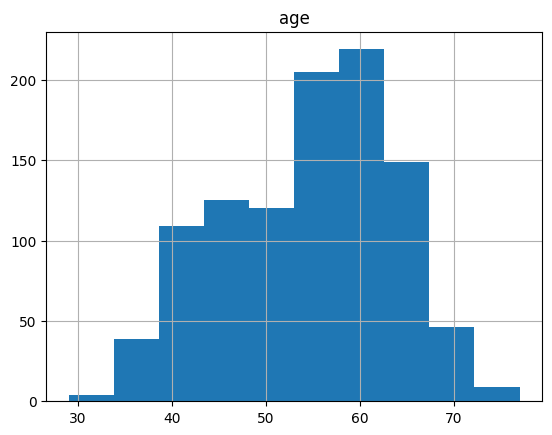

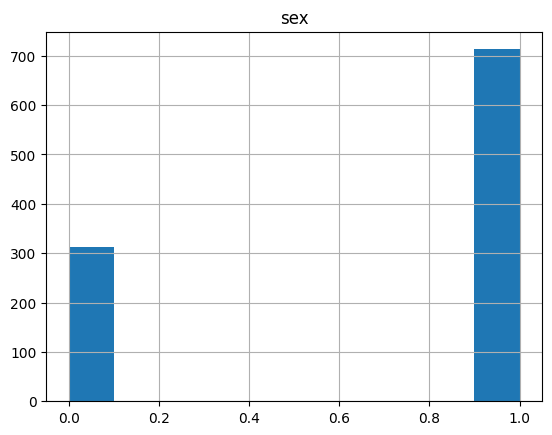

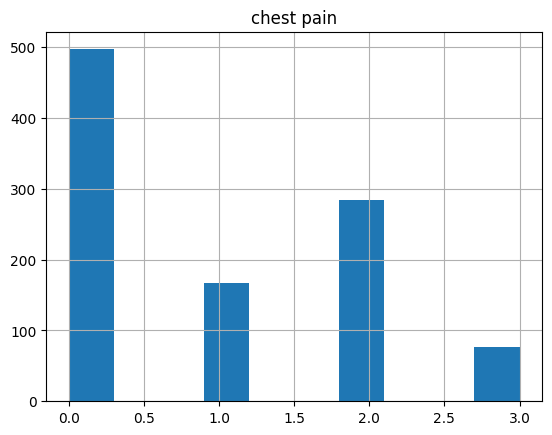

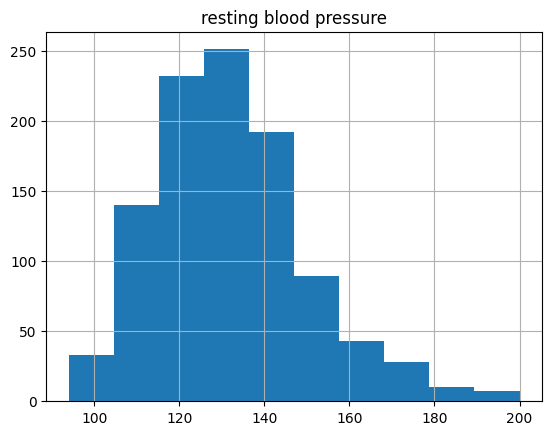

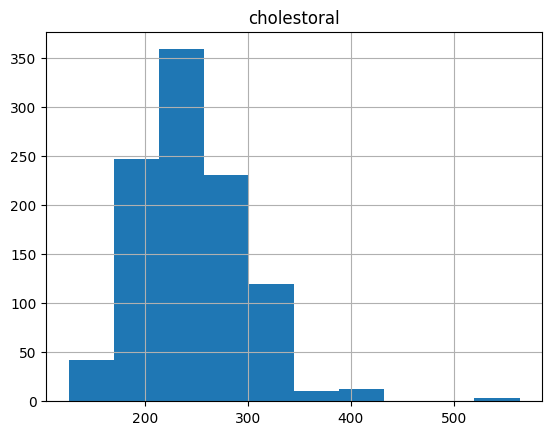

...

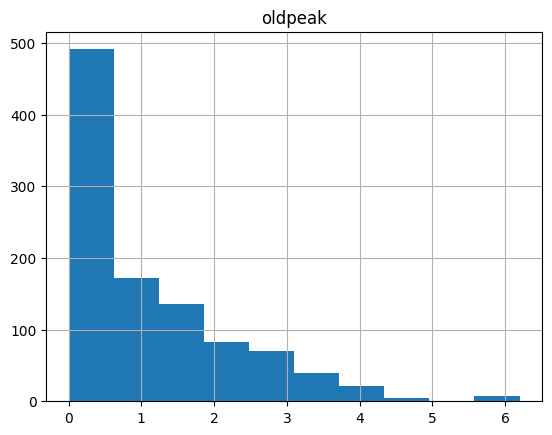

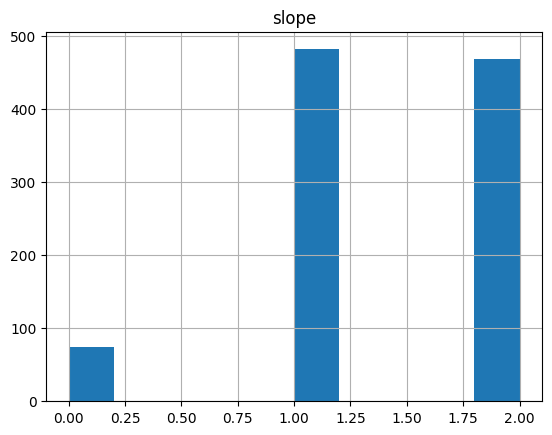

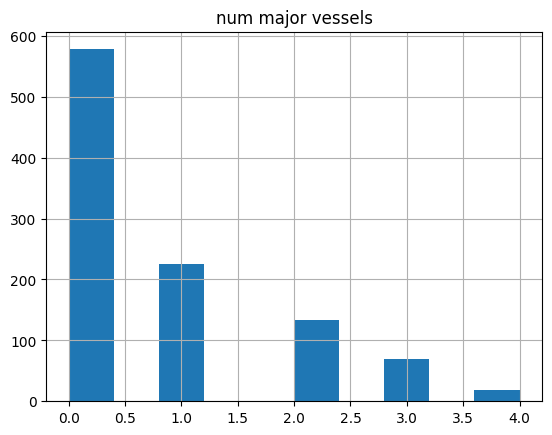

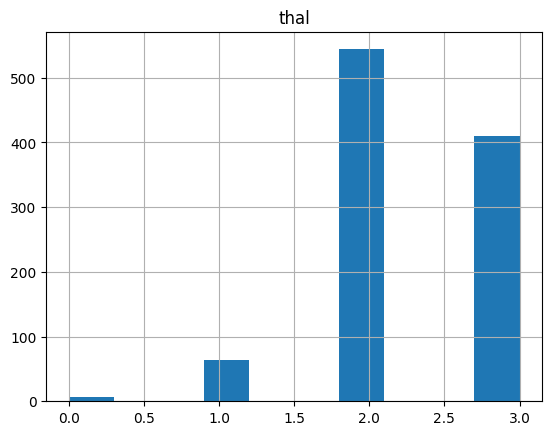

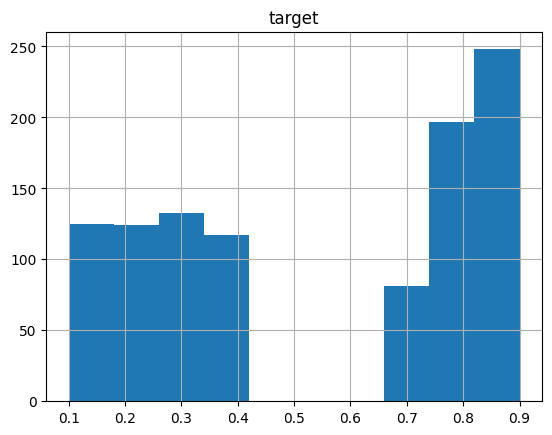

In [ ]:
#distribution of each columns
for i in df.columns:
  df.hist(column=i)

In [ ]:
female=len(df[df['sex']==0])
male=len(df[df['sex']==1])
print(f'Total number of male :{male}\nTotal number of female :{female}')
df.describe()

Total number of male :713
Total number of female :312


,age,sex,chest pain,resting blood pressure,cholestoral,fasting blood sugar,resting ecg,max heart rate,exercise induced angina,oldpeak,slope,num major vessels,thal,target
count,1025.000000,1025.000000,1025.000000,1025.000000,1025.00000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000
mean,54.434146,0.695610,0.942439,131.611707,246.00000,0.149268,0.529756,149.114146,0.336585,1.071512,1.385366,0.754146,2.323902,0.536390
std,9.072290,0.460373,1.029641,17.516718,51.59251,0.356527,0.527878,23.005724,0.472772,1.175053,0.617755,1.030798,0.620660,0.285822
min,29.000000,0.000000,0.000000,94.000000,126.00000,0.000000,0.000000,71.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.100000
25%,48.000000,0.000000,0.000000,120.000000,211.00000,0.000000,0.000000,132.000000,0.000000,0.000000,1.000000,0.000000,2.000000,0.260000
50%,56.000000,1.000000,1.000000,130.000000,240.00000,0.000000,1.000000,152.000000,0.000000,0.800000,1.000000,0.000000,2.000000,0.710000
75%,61.000000,1.000000,2.000000,140.000000,275.00000,0.000000,1.000000,166.000000,1.000000,1.800000,2.000000,1.000000,3.000000,0.810000
max,77.000000,1.000000,3.000000,200.000000,564.00000,1.000000,2.000000,202.000000,1.000000,6.200000,2.000000,4.000000,3.000000,0.900000


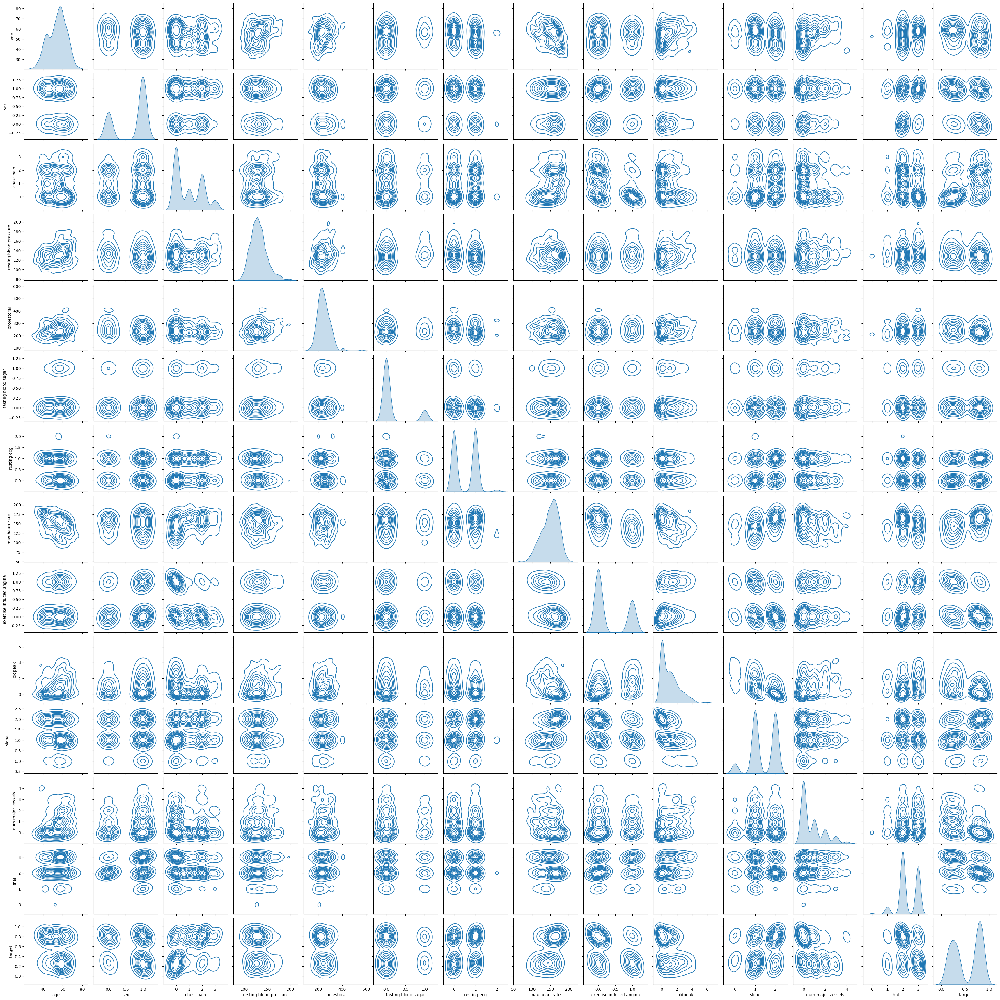

In [ ]:
#pairplot
sns.pairplot(df,kind='kde')
plt.show()

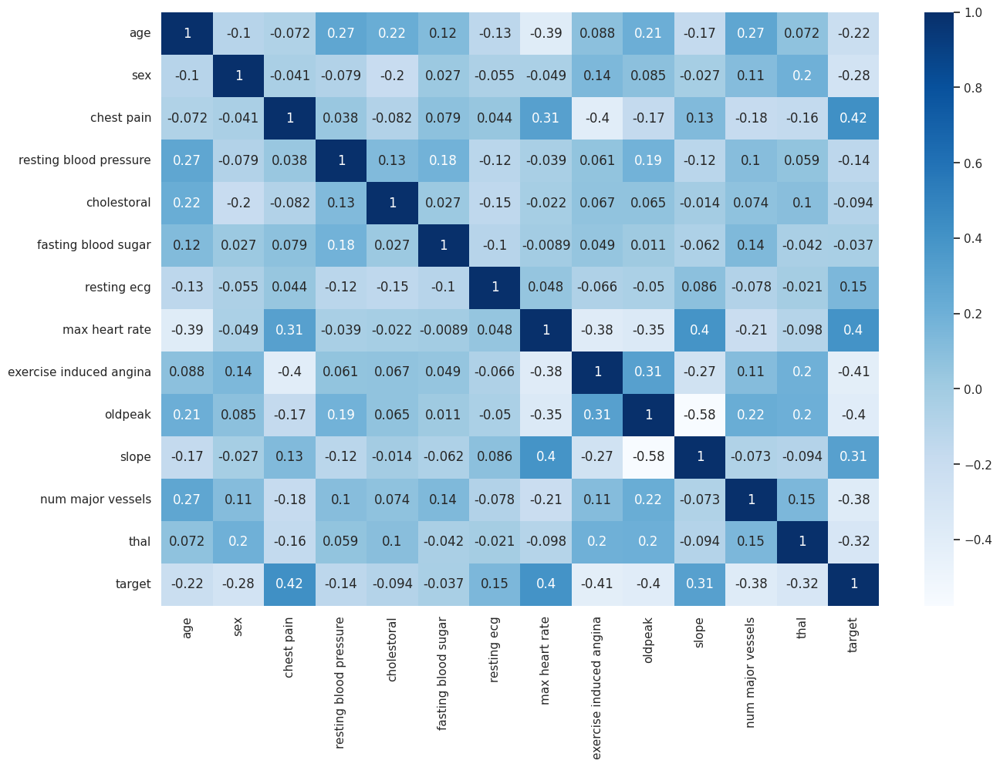

,age,sex,chest pain,resting blood pressure,cholestoral,fasting blood sugar,resting ecg,max heart rate,exercise induced angina,oldpeak,slope,num major vessels,thal,target
age,1.000000,-0.103240,-0.071966,0.271121,0.219823,0.121243,-0.132696,-0.390227,0.088163,0.208137,-0.169105,0.271551,0.072297,-0.215906
sex,-0.103240,1.000000,-0.041119,-0.078974,-0.198258,0.027200,-0.055117,-0.049365,0.139157,0.084687,-0.026666,0.111729,0.198424,-0.276350
chest pain,-0.071966,-0.041119,1.000000,0.038177,-0.081641,0.079294,0.043581,0.306839,-0.401513,-0.174733,0.131633,-0.176206,-0.163341,0.415776
resting blood pressure,0.271121,-0.078974,0.038177,1.000000,0.127977,0.181767,-0.123794,-0.039264,0.061197,0.187434,-0.120445,0.104554,0.059276,-0.135662
cholestoral,0.219823,-0.198258,-0.081641,0.127977,1.000000,0.026917,-0.147410,-0.021772,0.067382,0.064880,-0.014248,0.074259,0.100244,-0.093788
fasting blood sugar,0.121243,0.027200,0.079294,0.181767,0.026917,1.000000,-0.104051,-0.008866,0.049261,0.010859,-0.061902,0.137156,-0.042177,-0.037065
resting ecg,-0.132696,-0.055117,0.043581,-0.123794,-0.147410,-0.104051,1.000000,0.048411,-0.065606,-0.050114,0.086086,-0.078072,-0.020504,0.148220
max heart rate,-0.390227,-0.049365,0.306839,-0.039264,-0.021772,-0.008866,0.048411,1.000000,-0.380281,-0.349796,0.395308,-0.207888,-0.098068,0.399374
exercise induced angina,0.088163,0.139157,-0.401513,0.061197,0.067382,0.049261,-0.065606,-0.380281,1.000000,0.310844,-0.267335,0.107849,0.197201,-0.413340
oldpeak,0.208137,0.084687,-0.174733,0.187434,0.064880,0.010859,-0.050114,-0.349796,0.310844,1.000000,-0.575189,0.221816,0.202672,-0.396015


In [ ]:
#correlation and heatmap
correlation=df.corr()
sns.heatmap(correlation,annot=True,cmap='Blues')
plt.show()
correlation


The study on the heatmap provides the idea that Chest Pain, Maximum heart rate ,slope of the peak exercise ST segment shows a good positive correlation with target which is probablity of having heart disease.Also oldpeak(ST depression induced by exercise relative to rest),exercise induced angina,number of major vessels,sex,age shows a good negative correlation with the target. But Fasting blood sugar, cholesterol,resting ecg has low correlation with our target.

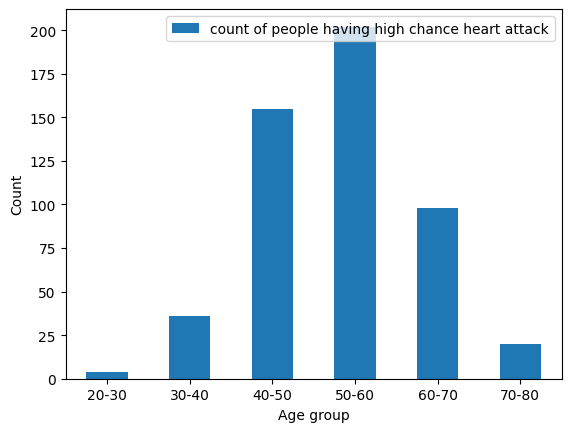

In [ ]:
#Predict the age for which the heart attack is common
tar=df[df['target']>0.7]
r0=tar['age'].tolist()
tar_grp=[len([i for i in r0 if i>=20 and i<30]),len([i for i in r0 if i>=30 and i<40]),len([i for i in r0 if i>=40 and i<50]),len([i for i in r0 if i>=50 and i<60]),len([i for i in r0 if i>=60 and i<70]),len([i for i in r0 if i>=70 and i<80])]
groups=['20-30','30-40','40-50','50-60','60-70','70-80']
df00=pd.DataFrame({'count of people having high chance heart attack':tar_grp},index=groups)
df00.plot.bar(rot=0,xlabel='Age group',ylabel='Count')
plt.show()

Grouping the age with a range of 10 and analyzing the target variable the 50-60 age group is most affected by heart diseases.More than 80% of the total is between 40 and 70.Further study on these groups gives
that 50-55 is most common and the 40-45 and then 55-60.

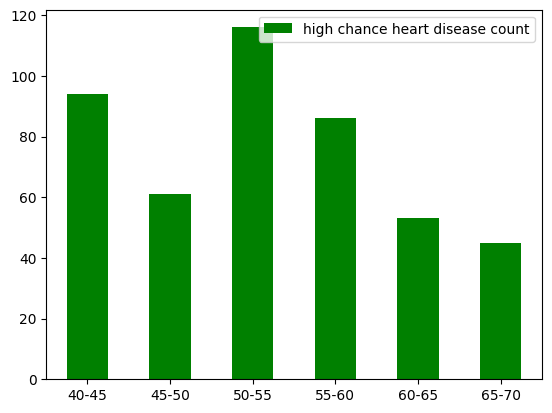

In [ ]:
tar=df[df['target']>0.7]
r0=tar['age'].tolist()
tar_grp=[len([i for i in r0 if i>=40 and i<45]),len([i for i in r0 if i>=45 and i<50]),len([i for i in r0 if i>=50 and i<55]),len([i for i in r0 if i>=55 and i<60]),len([i for i in r0 if i>=60 and i<65]),len([i for i in r0 if i>=65 and i<70])]
groups=['40-45','45-50','50-55','55-60','60-65','65-70']
df00=pd.DataFrame({'high chance heart disease count':tar_grp},index=groups)
df00.plot.bar(rot=0,color='g')
plt.show()

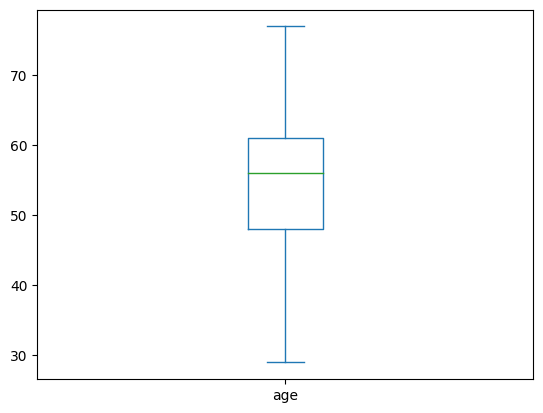

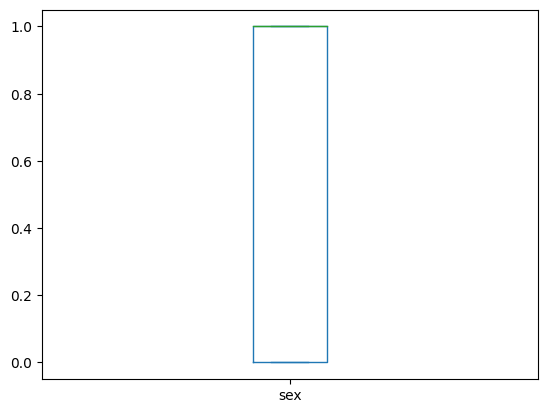

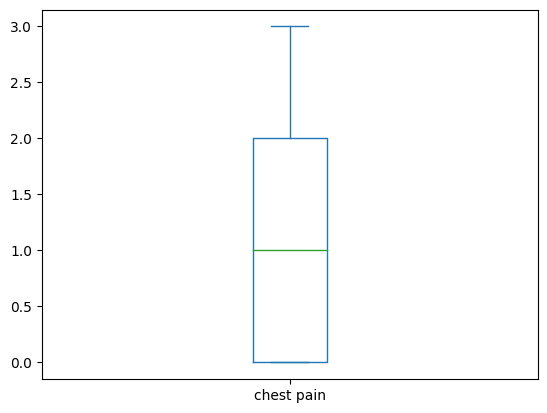

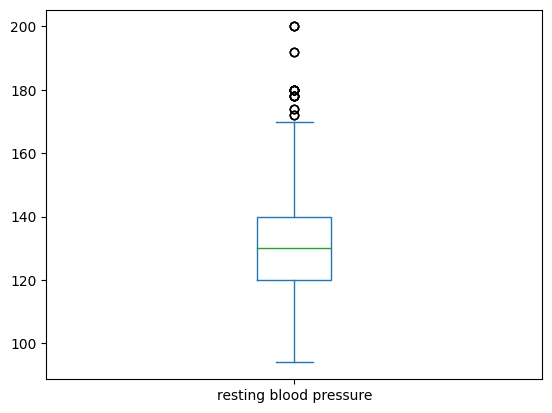

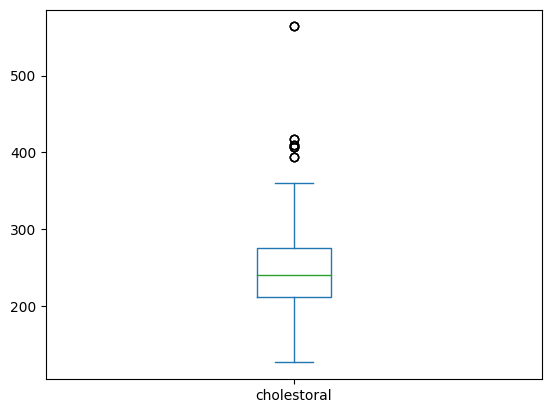

...

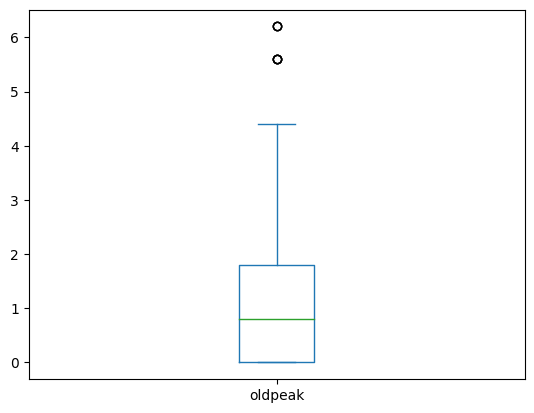

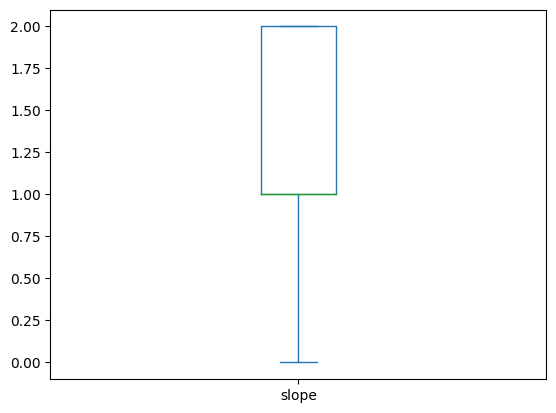

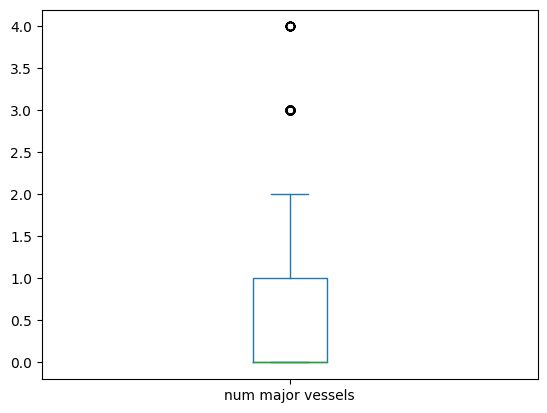

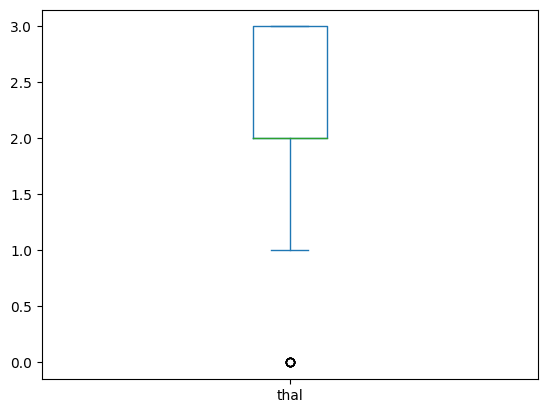

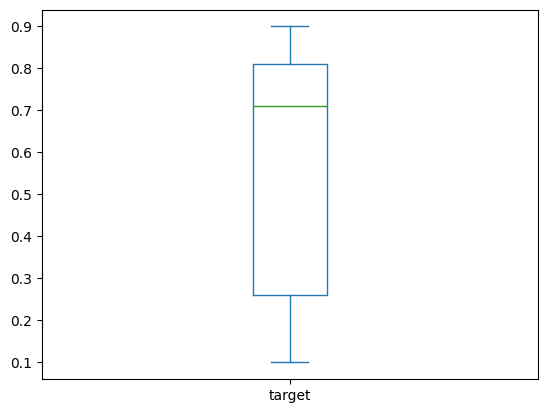

In [ ]:
a=df.columns.tolist()
for i in a:
  df1=pd.DataFrame(df,columns=[i])
  df1.plot.box()

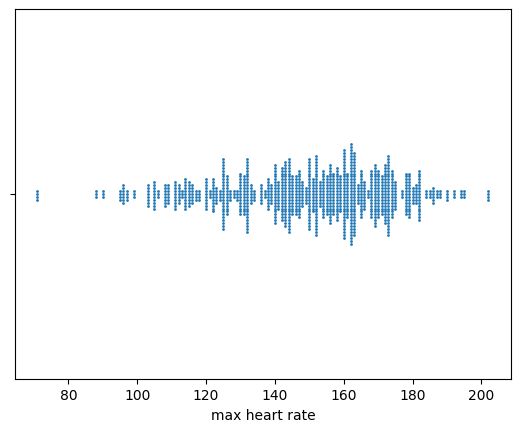

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 5.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


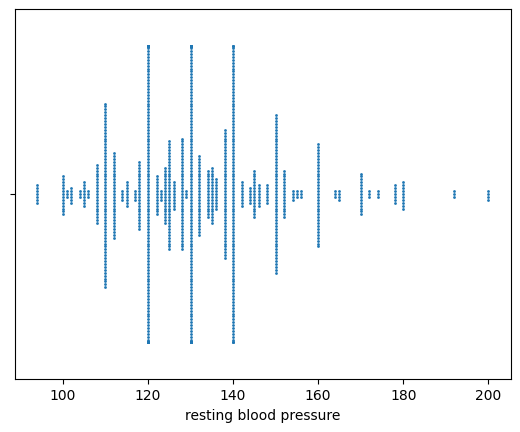

<Axes: xlabel='fasting blood sugar'>

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 80.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


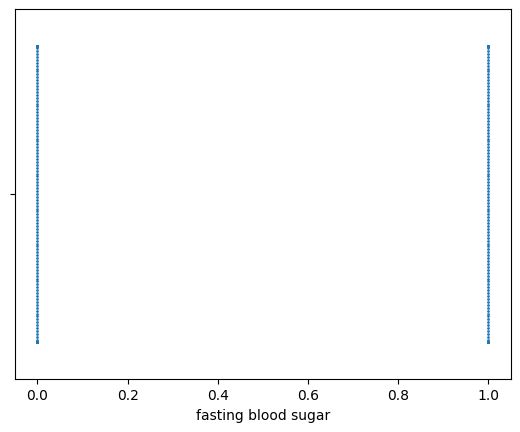

In [ ]:
#swarm plot
sns.swarmplot(x='max heart rate',data=df,size=2)
plt.show()
sns.swarmplot(x='resting blood pressure',data=df,size=2)
plt.show()
sns.swarmplot(x='fasting blood sugar',data=df,size=2)

<Axes: xlabel='resting blood pressure'>

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 5.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


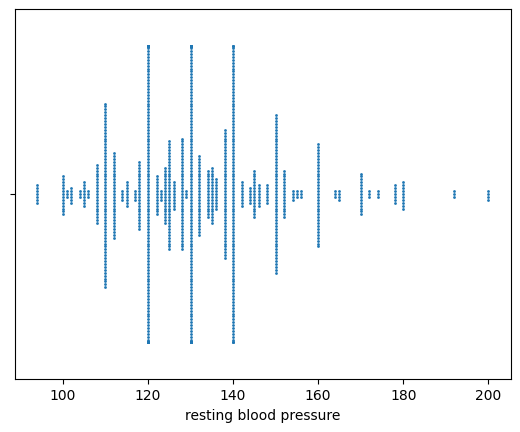

In [ ]:
sns.swarmplot(x='resting blood pressure',data=df,size=2)

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 24.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 16.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


<Axes: xlabel='chest pain', ylabel='target'>

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 31.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 22.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


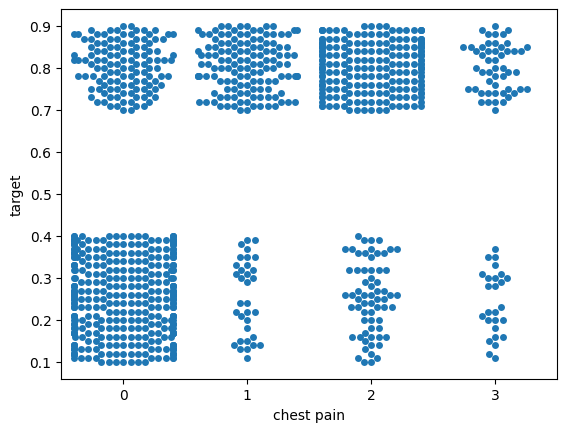

In [ ]:
sns.swarmplot(x='chest pain',y='target',data=df)

In [ ]:
#Detecting outliers with interquartile range(IQR)
col=df.columns
for i in col:
  IQR=df[i].quantile(0.75)-df[i].quantile(0.25)
  lower_outlier=df[i].quantile(0.25)-(1.5*IQR)
  higher_outlier=df[i].quantile(0.75)+(1.5*IQR)
  a=df.loc[df[i]>=higher_outlier][i].tolist()
  b=df.loc[df[i]<=lower_outlier][i].tolist()
  print(f"values in column {i} higher than higher outlier.")
  print(a)



values in column age higher than higher outlier.
[]
values in column sex higher than higher outlier.
[]
values in column chest pain higher than higher outlier.
[]
values in column resting blood pressure higher than higher outlier.
[180, 178, 170, 170, 174, 170, 180, 192, 170, 200, 170, 178, 170, 192, 180, 170, 200, 192, 172, 180, 170, 174, 178, 180, 200, 180, 178, 170, 180, 170, 178, 174, 180, 170, 200, 170, 170, 172, 170, 170, 180, 178, 178, 172, 180]
values in column cholestoral higher than higher outlier.
[417, 564, 409, 564, 394, 407, 564, 407, 394, 394, 409, 417, 407, 407, 417, 409]
values in column fasting blood sugar higher than higher outlier.
[0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 

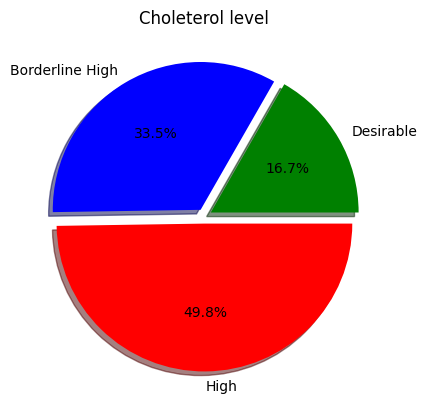

In [ ]:
#find the percentage of people having desirable,borderline and high cholesterol level using pie chart visualization.
chol=[len(df[df['cholestoral']<200]),len(df[df['cholestoral'].between(200,239)]),len(df[df['cholestoral']>240])]
chol_level=['Desirable','Borderline High','High']
plt.pie(chol,labels=chol_level,explode=[0.05,0.05,0.05],shadow=True,colors=['green','blue','red'],autopct='%2.1f%%')
plt.title('Choleterol level')
plt.show()

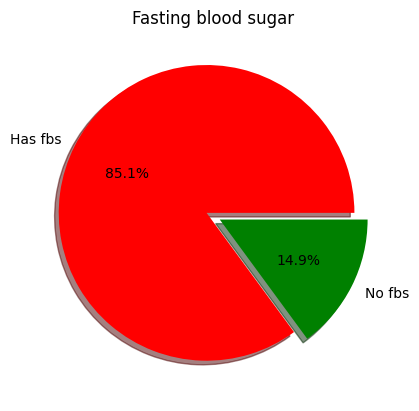

In [ ]:
fbs=[len(df[df['fasting blood sugar']==0]),len(df[df['fasting blood sugar']==1])]
fbs_level=['Has fbs','No fbs']
plt.pie(fbs,labels=fbs_level,explode=[0.05,0.05],shadow=True,colors=['red','green'],autopct='%2.1f%%')
plt.title('Fasting blood sugar')
plt.show()

<Axes: xlabel='Target', ylabel='Count'>

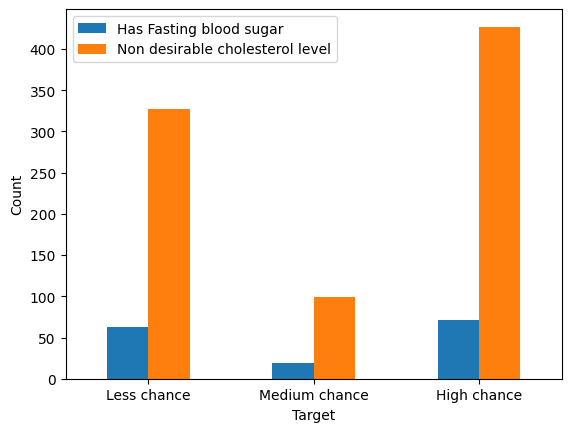

In [ ]:
#Fasting bloodsugar according to target
fs_y=df[df['fasting blood sugar']==1]['target'].tolist()
tar1=[len([i for i in fs_y if i<0.35]),len([i for i in fs_y if i>=0.35 and i<0.7]),len([i for i in fs_y if i>=0.7])]
high_chol=df[df['cholestoral']>200]['target'].tolist()
tar2=[len([i for i in high_chol if i<0.35]),len([i for i in high_chol if i>=0.35 and i<0.7]),len([i for i in high_chol if i>=0.7])]
t=['Less chance','Medium chance','High chance']
df71=pd.DataFrame({'Has Fasting blood sugar':tar1,'Non desirable cholesterol level':tar2},index=t)
df71.plot.bar(rot=0,xlabel='Target',ylabel='Count')

Study on the people having higher cholesterol and having fasting blood sugar resulted as bar plot.There is a significant count of people who are having high cholesterol and blood sugar and less chance of heart disease. However, around 50% of people having high cholesterol and having fasting blood sugar has a higher chance of having heart disease.

<Axes: >

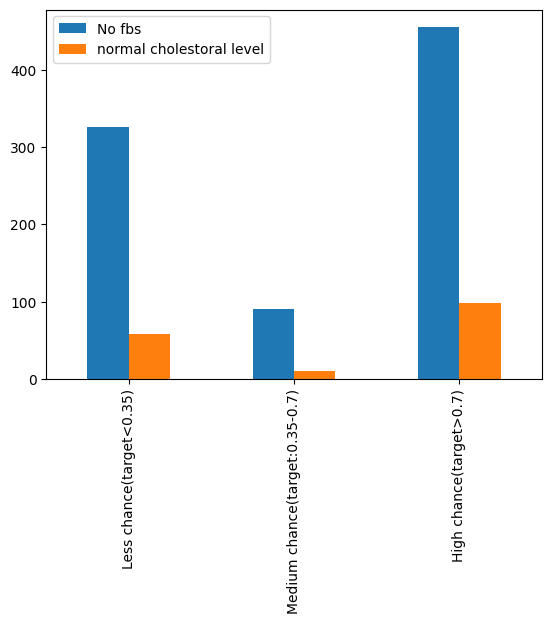

In [ ]:
fs_y=df[df['fasting blood sugar']==0]['target'].tolist()
tar1=[len([i for i in fs_y if i<0.35]),len([i for i in fs_y if i>=0.35 and i<0.7]),len([i for i in fs_y if i>=0.7])]
high_chol=df[df['cholestoral']<200]['target'].tolist()
tar2=[len([i for i in high_chol if i<0.35]),len([i for i in high_chol if i>=0.35 and i<0.7]),len([i for i in high_chol if i>=0.7])]
t=['Less chance(target<0.35)','Medium chance(target:0.35-0.7)','High chance(target>0.7)']
df71=pd.DataFrame({'No fbs':tar1,'normal cholestoral level':tar2},index=t)
df71.plot.bar()

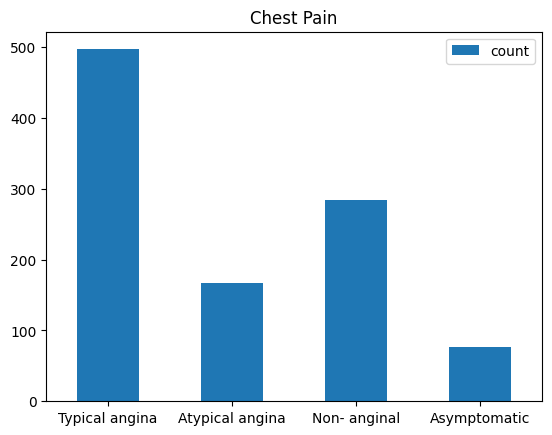

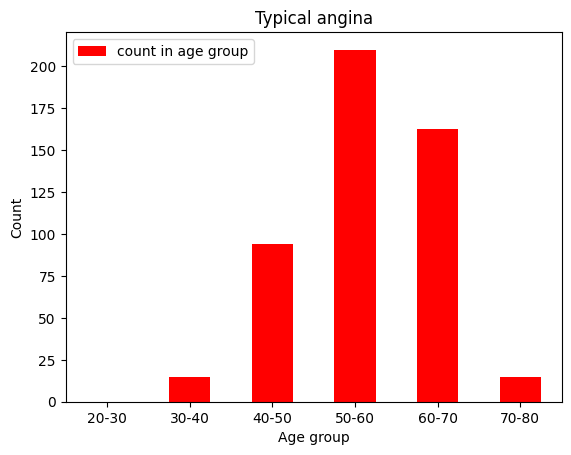

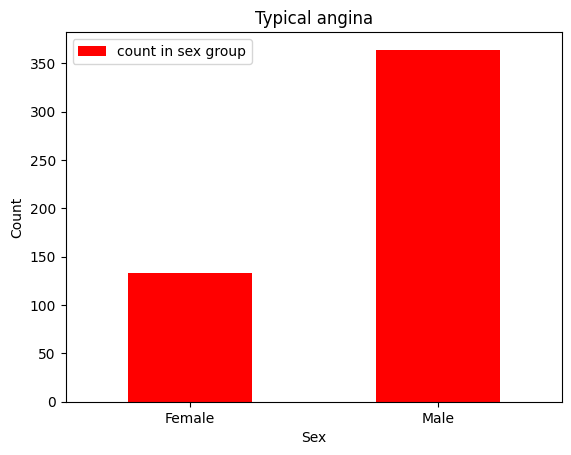

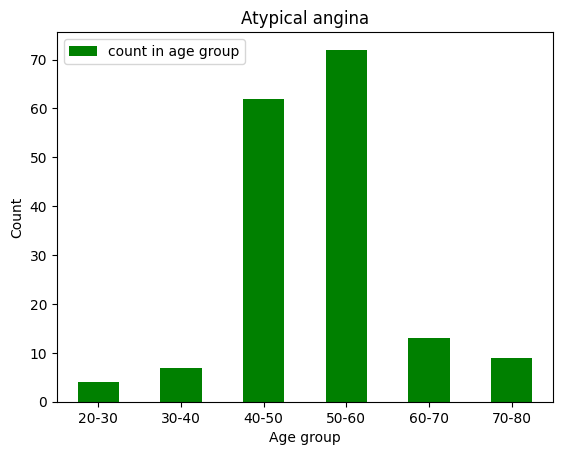

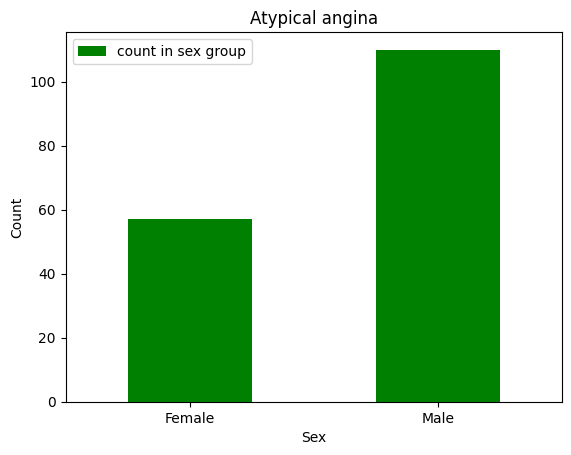

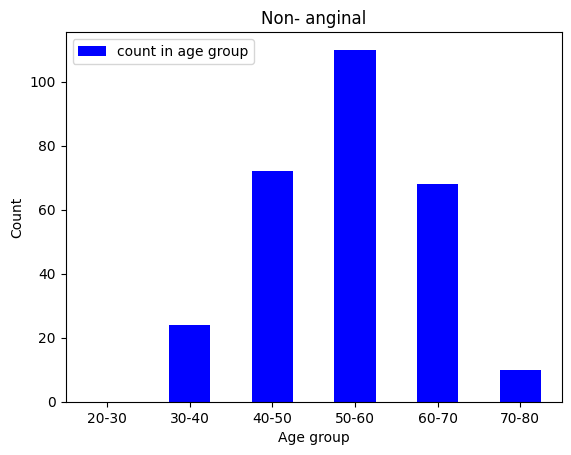

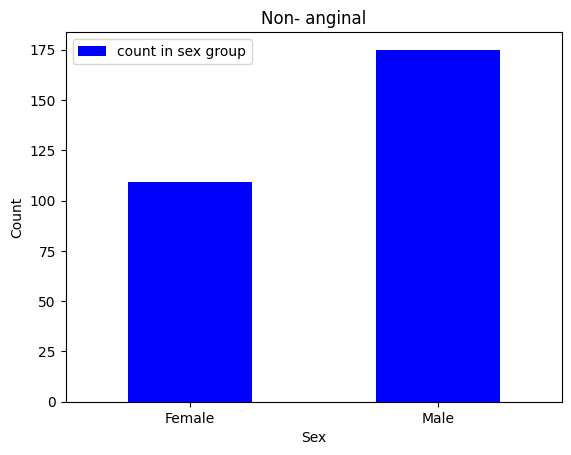

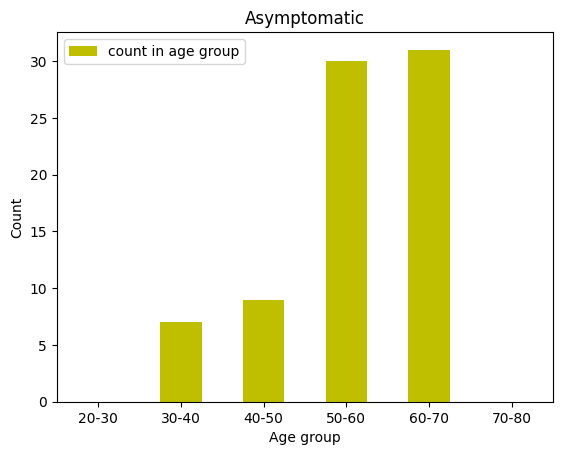

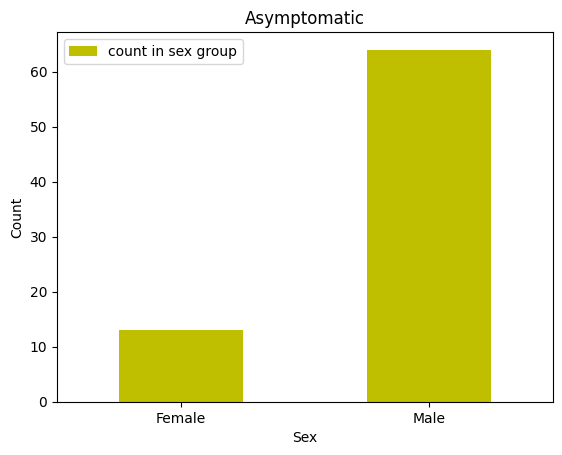

In [ ]:
#study on along 4 types of chest pain data and find which type is most effected.Also find age groups and sex groups each of the type of chest pains are effected.
cp=['Typical angina','Atypical angina','Non- anginal','Asymptomatic']
x=[len(df[df['chest pain']==0]),len(df[df['chest pain']==1]),len(df[df['chest pain']==2]),len(df[df['chest pain']==3])]
df11=pd.DataFrame({'count':x},index=cp)
ax=df11.plot.bar(rot=0,title='Chest Pain')
for (j,m) in zip(range(4),range(4)):
  angina=df[df['chest pain']==j]
  x0=angina['age'].tolist()
  y0=angina['sex'].tolist()
  age_group=[len([i for i in x0 if i>=20 and i<30]),len([i for i in x0 if i>=30 and i<40]),len([i for i in x0 if i>=40 and i<50]),len([i for i in x0 if i>=50 and i<60]),len([i for i in x0 if i>=60 and i<70]),len([i for i in x0 if i>=70 and i<80])]
  sex_group=[len([l for l in y0 if l==0]),len([l for l in y0 if l==1])]
  groups=['20-30','30-40','40-50','50-60','60-70','70-80']
  grp=['Female','Male']
  df13=pd.DataFrame({'count in sex group':sex_group},index=grp)
  df12=pd.DataFrame({'count in age group':age_group},index=groups)
  if j==0:
    k='Typical angina'
    c='r'
  elif j==1:
    k='Atypical angina'
    c='g'
  elif j==2:
    k='Non- anginal'
    c='b'
  else:
    k='Asymptomatic'
    c='y'
  ax1=df12.plot.bar(rot=0,title=k,color=c,xlabel='Age group',ylabel='Count')
  ax2=df13.plot.bar(rot=0,title=k,color=c,xlabel='Sex',ylabel='Count')

<Axes: xlabel='Angina', ylabel='Count of patients'>

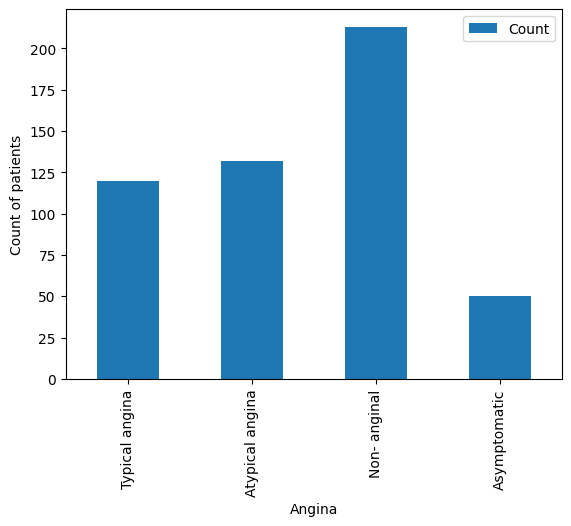

In [ ]:
#Different chest pains and their chances of being to heart disease
c=[]
for i in range(4):
  c.append(df[df['chest pain']==i]['target'].tolist())
cp_hd=[len([i for i in c[0] if i>0.7]),len([i for i in c[1] if i>0.7]),len([i for i in c[2] if i>0.7]),len([i for i in c[3] if i>0.7])]
cp=['Typical angina','Atypical angina','Non- anginal','Asymptomatic']
df01=pd.DataFrame({'Count':cp_hd},index=cp)
df01.plot.bar(xlabel='Anginal pain',ylabel='Count of patients')


Among all four types of chest pains Non-Anginal pain has Non-Anginal pain is more founded among the people having heart diseases and thus  need further more care.

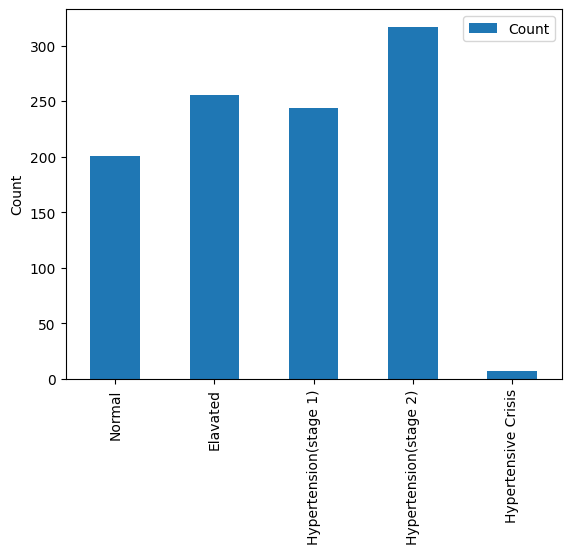

In [ ]:
#categorize and visualize  resting blood pressure accordingly to identify how many are facing with hypertension.
blood_pressure=[len(df[df['resting blood pressure']<120]),len(df[df['resting blood pressure'].between(120,129)]),len(df[df['resting blood pressure'].between(130,139)]),len(df[df['resting blood pressure'].between(140,180)]),len(df[df['resting blood pressure']>180])]
bp=['Normal','Elavated','Hypertension(stage 1)','Hypertension(stage 2)','Hypertensive Crisis']
df21=pd.DataFrame({'Count':blood_pressure},index=bp)
df21.plot.bar(ylabel='Count')
print()


<Axes: xlabel='Chance of Heart Attack', ylabel='Count'>

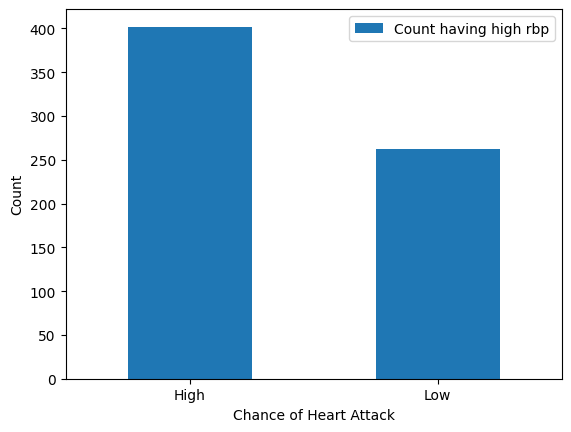

In [ ]:
#blood pressure,maximum heart rate target
rbp0=df[df['resting blood pressure']>=120]
v=rbp0['target'].tolist()
rbp_hd=[len([i for i in v if i>0.7]),len([i for i in v if i<0.3])]
rp=['High','Low']
rbp1=pd.DataFrame({'Count having high rbp':rbp_hd},index=rp)
rbp1.plot.bar(rot=0,xlabel='Chance of Heart Attack',ylabel='Count')

<Axes: xlabel='age', ylabel='count'>

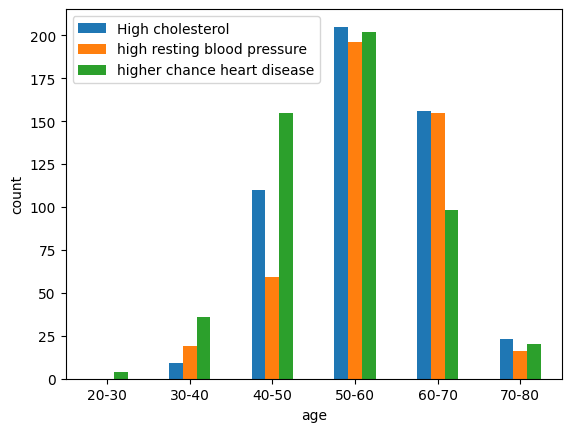

In [ ]:
#make a study on the effects of high choleterol,resting blood pressure with chance of higher chance of heart disease in case of age groups.Also add exercise induced angina .
rbp_h=df[df['resting blood pressure']>130]
w0=rbp_h['age'].tolist()
rbp=[len([i for i in w0 if i>=20 and i<30]),len([i for i in w0 if i>=30 and i<40]),len([i for i in w0 if i>=40 and i<50]),len([i for i in w0 if i>=50 and i<60]),len([i for i in w0 if i>=60 and i<70]),len([i for i in w0 if i>=70 and i<80])]
choles=df[df['cholestoral']>240]
z0=choles['age'].tolist()
chol_grp=[len([i for i in z0 if i>=20 and i<30]),len([i for i in z0 if i>=30 and i<40]),len([i for i in z0 if i>=40 and i<50]),len([i for i in z0 if i>=50 and i<60]),len([i for i in z0 if i>=60 and i<70]),len([i for i in z0 if i>=70 and i<80])]
tar=df[df['target']>0.7]
r0=tar['age'].tolist()
tar_grp=[len([i for i in r0 if i>=20 and i<30]),len([i for i in r0 if i>=30 and i<40]),len([i for i in r0 if i>=40 and i<50]),len([i for i in r0 if i>=50 and i<60]),len([i for i in r0 if i>=60 and i<70]),len([i for i in r0 if i>=70 and i<80])]
df31=pd.DataFrame({'High cholesterol':chol_grp,'high resting blood pressure':rbp,'higher chance heart disease':tar_grp},index=groups)
df31.plot.bar(rot=0,xlabel='age',ylabel='count')

<Axes: title={'center': 'Sex distribution on target'}>

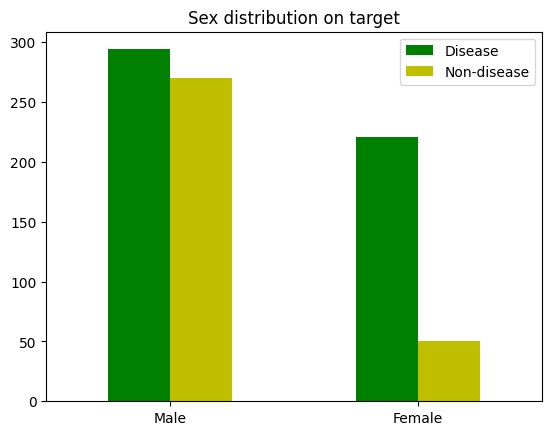

In [ ]:
#disease(target) distribution according to sex
D=df[df['target']>0.7]
ND=df[df['target']<0.3]
disease=[len(D[D['sex']==1]),len(D[D['sex']==0])]
Non_disease=[len(ND[ND['sex']==1]),len(ND[ND['sex']==0])]
sex=['Male','Female']
df61=pd.DataFrame({'Disease':disease,'Non-disease':Non_disease},index=sex)
df61.plot.bar(rot=0,title='Sex distribution on target',color=['g','y'])

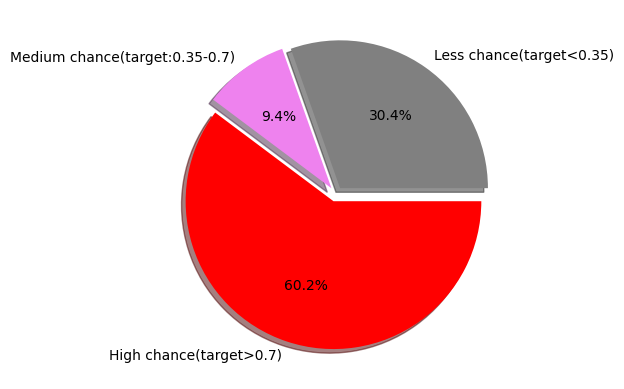

In [ ]:
#resting ecg having ST-T wave abnormality (T wave inversions and/or ST elevation or depression of > 0.05 mV) effect on target
recg=df[df['resting ecg']==1]['target'].tolist()
rst_tar=[len([i for i in recg if i<0.35]),len([i for i in recg if i>=0.35 and i<0.7]),len([i for i in recg if i>=0.7])]
plt.pie(rst_tar,labels=t,explode=[0.05,0.05,0.05],shadow=True,colors=['grey','violet','red'],autopct='%2.1f%%')
plt.show()

1.max heart rate and target 2.regression study on chest pain,thalach,slope-(positive)oldpeak,exang,ca,thal,sex,age(negative) to target 3.fbs,chol,trestbps,restecg low correlation to target 4.

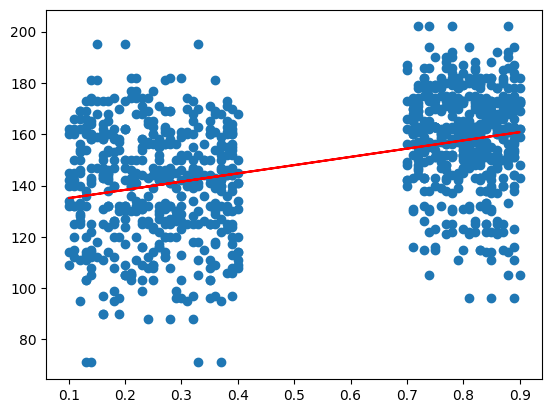

In [ ]:
#Regression study maximum heart rates(thalach) with target
thalach=df['max heart rate'].tolist()
tar0=df['target'].tolist()
reg=np.polyfit(x=tar0,y=thalach,deg=1)
trend=np.polyval(reg,tar0)
plt.scatter(x=tar0,y=thalach)
plt.plot(tar0,trend,'r')


In [ ]:
8.# How does the number of major vessels colored by fluoroscopy (caa) vary between individuals with and without heart disease?
#Insight: Individuals with heart disease tend to have a higher median number of major vessels colored by fluoroscopy compared to those without heart disease, indicating a potential association between the number of major vessels and heart disease.

<Axes: >

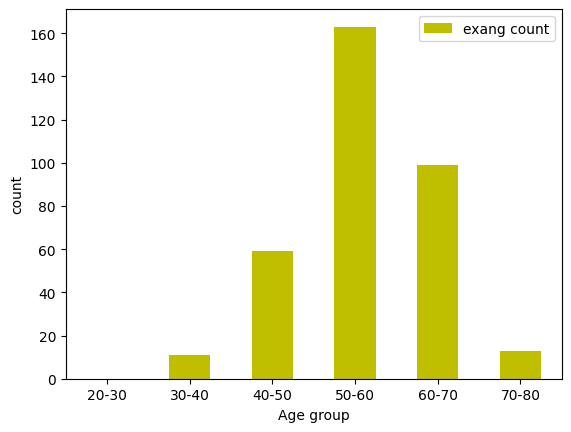

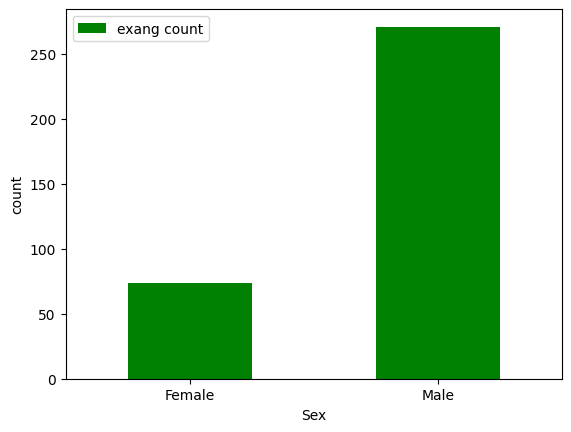

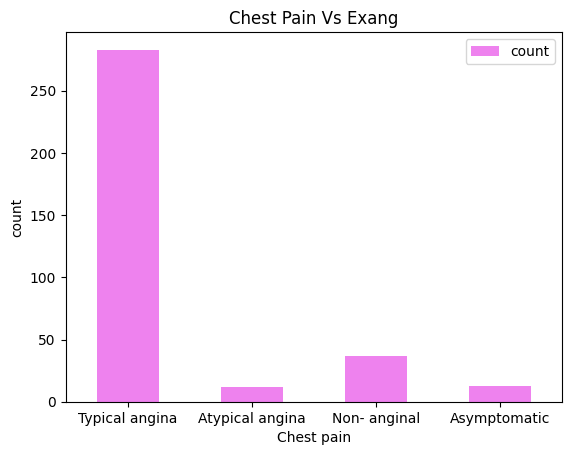

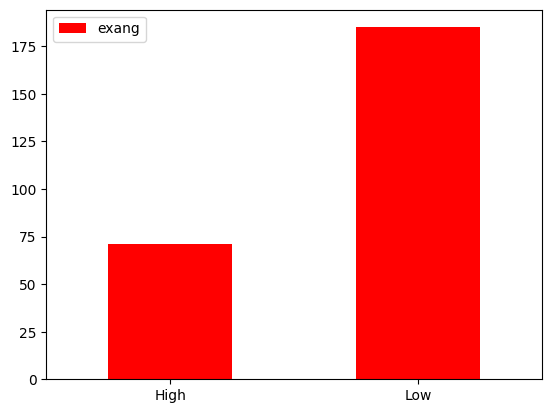

In [ ]:
# exercise-induced angina VS age, sex,chest pain
s=df[df['exercise induced angina']==1]
z0=s['age'].tolist()
z1=s['sex'].tolist()
age_g=[len([i for i in z0 if i>=20 and i<30]),len([i for i in z0 if i>=30 and i<40]),len([i for i in z0 if i>=40 and i<50]),len([i for i in z0 if i>=50 and i<60]),len([i for i in z0 if i>=60 and i<70]),len([i for i in z0 if i>=70 and i<80])]
sex_g=[len([l for l in z1 if l==0]),len([l for l in z1 if l==1])]
grps=['20-30','30-40','40-50','50-60','60-70','70-80']
gp=['Female','Male']
z11=pd.DataFrame({'exang count':age_g},index=grps)
z11.plot.bar(rot=0,color='y',xlabel='Age group',ylabel='count')
z12=pd.DataFrame({'exang count':sex_g},index=gp)
z12.plot.bar(rot=0,color='g',xlabel='Sex',ylabel='count')
c=['Typical angina','Atypical angina','Non- anginal','Asymptomatic']
x=[len(s[s['chest pain']==0]),len(s[s['chest pain']==1]),len(s[s['chest pain']==2]),len(s[s['chest pain']==3])]
df55=pd.DataFrame({'count':x},index=c)
ax=df55.plot.bar(rot=0,title='Chest Pain Vs Exang',xlabel='Chest pain',ylabel='count',color='violet')

D1=df[df['target']>0.7]
ND1=df[df['target']<0.3]
disease=[len(s[s['target']>=0.7]),len(s[s['target']<=0.3])]
h=['High','Low']
df66=pd.DataFrame({'exang':disease},index=h)
df66.plot.bar(rot=0,color='r')